# Data Quality Assurance for Central Valley Data
## Capstone Spring 2021
## Chitra Agastya

This notebook is used to perform checks on the quality of the California data that is gathered using Google Earth Engine. It consists of several rounds of visual analysis.

In [1]:
import tarfile
import os
import numpy as np
import PIL
import rasterio
import folium
from matplotlib import pyplot as plt
import cv2
import pandas as pd
%matplotlib inline

In [10]:
# Spectral band names to read related GeoTIFF files
band_names = ['B01', 'B02', 'B03', 'B04', 'B05',
              'B06', 'B07', 'B08', 'B8A', 'B09', 'B11', 'B12']
rgb_names = ['B04', 'B03', 'B02']
ag_names = ['B11', 'B08', 'B02']

SCALE_FACTOR = 5000

In [22]:
base_paths = [ 'Delano_S2SR_1_2019_35.875_-119.375',
    'Delano_S2SR_12_2019_35.625_-119.375',
    'Delano_S2SR_5_2019_35.875_-119.125',
    'Delano_S2SR_6_2019_35.625_-119.125']

image_dir = '/home/cagastya/hdd/gee_central_valley'

In [11]:
rgb_names = ['B4', 'B3', 'B2']
rgub_names = ['B5', 'B6', 'B7']
ag_names = ['B11', 'B8', 'B2']
band_combinations = [rgb_names, rgub_names, ag_names]

In [12]:
def plot_band_combs(base_paths, band_combinations, month=5, scale = SCALE_FACTOR):
    imarrays = []
    for comb in band_combinations:
        for base_path in base_paths:
            for b, band_name in enumerate(comb):
                # First finds related GeoTIFF path and reads values as an array
                with rasterio.open(f'{image_dir}/{base_path}/{base_path}_msi_{band_name}.tif') as band_ds:
                    band_data = band_ds.read(1)
                    #print(band_data.max())
                    #print(band_ds.width, band_ds.height)
                    #print(band_ds.read(1).max(), band_ds.read(1).min())
                    if b == 0:
                        imarray = np.zeros((1135, 928,3))
                    if band_data.shape != imarray.shape[:2]:
                        band_data = cv2.resize(band_data, (imarray.shape[1],imarray.shape[0]))
                    imarray[:,:,b] = band_data / scale
            imarrays.append(imarray)

    fix, axes = plt.subplots(ncols=len(base_paths),
                             nrows=len(band_combinations),
                             sharex=True,
                             sharey=True,
                             figsize=(16,16))
    axes = axes.flatten()
    for i, img in enumerate(imarrays):
        axes[i].imshow(img)
    for ax in axes:
        ax.set_axis_off()
        
    plt.subplots_adjust(hspace=0.0,wspace=0.0)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

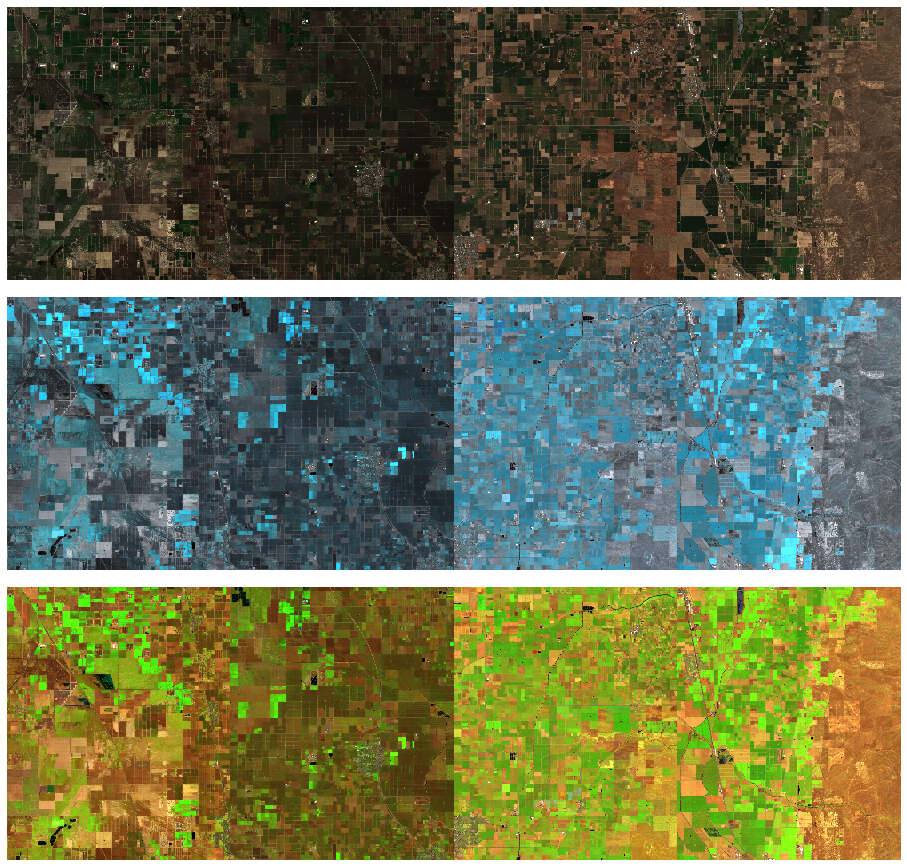

In [13]:
plot_band_combs(base_paths, band_combinations)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

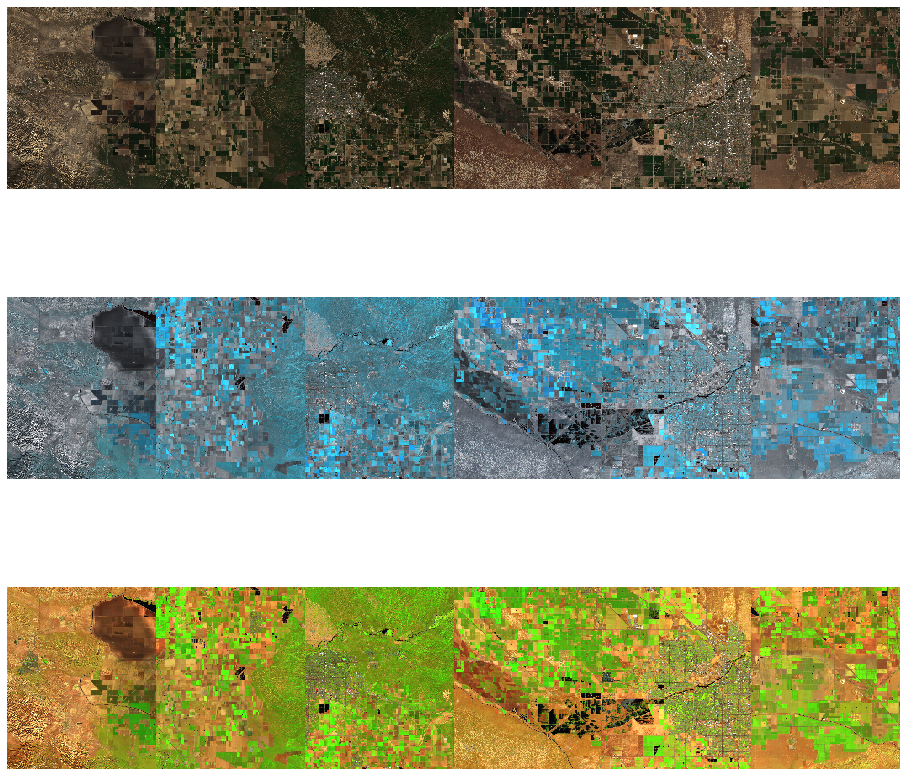

In [14]:
base_paths = [ 'Bakersfield_S2SR_1_2019_35.125_-119.375',
    'Bakersfield_S2SR_3_2019_35.125_-118.875',
    'Bakersfield_S2SR_3_2019_35.375_-118.875',
    'Bakersfield_S2SR_4_2019_35.375_-119.375',
    'Bakersfield_S2SR_6_2019_35.375_-119.125',
    'Bakersfield_S2SR_9_2019_35.125_-119.125'
    ]
plot_band_combs(base_paths, band_combinations)

In [23]:
imarrays = []
def plot_band_by_month(comb, months, scale=SCALE_FACTOR):
    for month in months:
        for comb in band_combinations:
            for base_path in base_paths:
                for b, band_name in enumerate(comb):
                    # First finds related GeoTIFF path and reads values as an array
                    with rasterio.open(f'{image_dir}/{base_path}/{base_path}_msi_{band_name}.tif') as band_ds:
                        band_data = band_ds.read(1)
                        if b == 0:
                            imarray = np.zeros((1135, 928,3))
                        if band_data.shape != imarray.shape[:2]:
                            band_data = cv2.resize(band_data, (imarray.shape[1],imarray.shape[0]))
                        imarray[:,:,b] = band_data / scale
                imarrays.append(imarray)

In [24]:
plot_band_by_month(ag_names, range(1,13))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

IndexError: index 48 is out of bounds for axis 0 with size 48

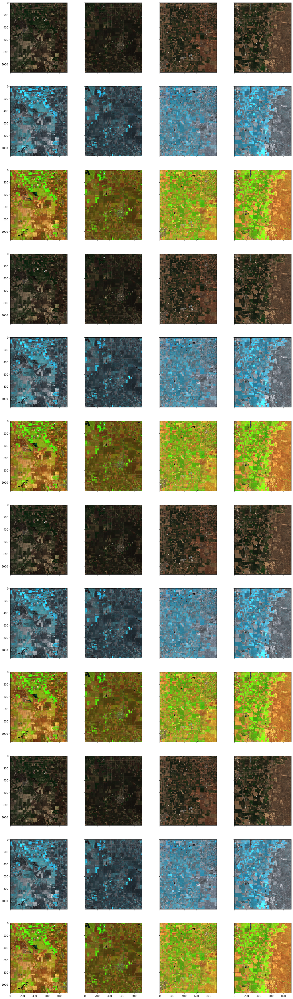

In [25]:
fix, axes = plt.subplots(ncols=4, nrows=12, sharex=True, sharey=True,figsize=(20,71))
axes = axes.flatten()
for i, img in enumerate(imarrays):
    axes[i].imshow(img)
for ax in axes:
    ax.set_axis_off()
    # show only the outside spines
#     ax.spines['top'].set_visible(ax.is_first_row())
#     ax.spines['bottom'].set_visible(ax.is_last_row())
#     ax.spines['left'].set_visible(ax.is_first_col())
#     ax.spines['right'].set_visible(ax.is_last_col())
plt.subplots_adjust(hspace=0.0,wspace=0.0)

In [95]:
def plot_grid(base_paths, comb, month, scale = SCALE_FACTOR):
    imarrays = []
    nrows, ncols = np.shape(base_paths)
    
    for row in base_paths:
        for base_path in row:
            for b, band_name in enumerate(comb):
                # First finds related GeoTIFF path and reads values as an array
                with rasterio.open(f'./{base_path}/{base_path}_msi_{band_name}_{month}.tif') as band_ds:
                    band_data = band_ds.read(1)
                    #print(band_ds.width, band_ds.height)
                    #print(band_ds.read(1).max(), band_ds.read(1).min())
                    if b == 0:
                        imarray = np.zeros((1135, 928,3))
                    if band_data.shape != imarray.shape[:2]:
                        band_data = cv2.resize(band_data, (imarray.shape[1],imarray.shape[0]))
                    imarray[:,:,b] = band_data / scale
            imarrays.append(imarray)

    fix, axes = plt.subplots(ncols=ncols,
                             nrows=nrows,
                             sharex=True,
                             sharey=True,
                             figsize=(4*ncols,5.02*nrows))
    axes = axes.flatten()
    for i, img in enumerate(imarrays):
        axes[i].imshow(img)
    for ax in axes:
        ax.set_axis_off()
        
    plt.subplots_adjust(hspace=0.0,wspace=0.0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

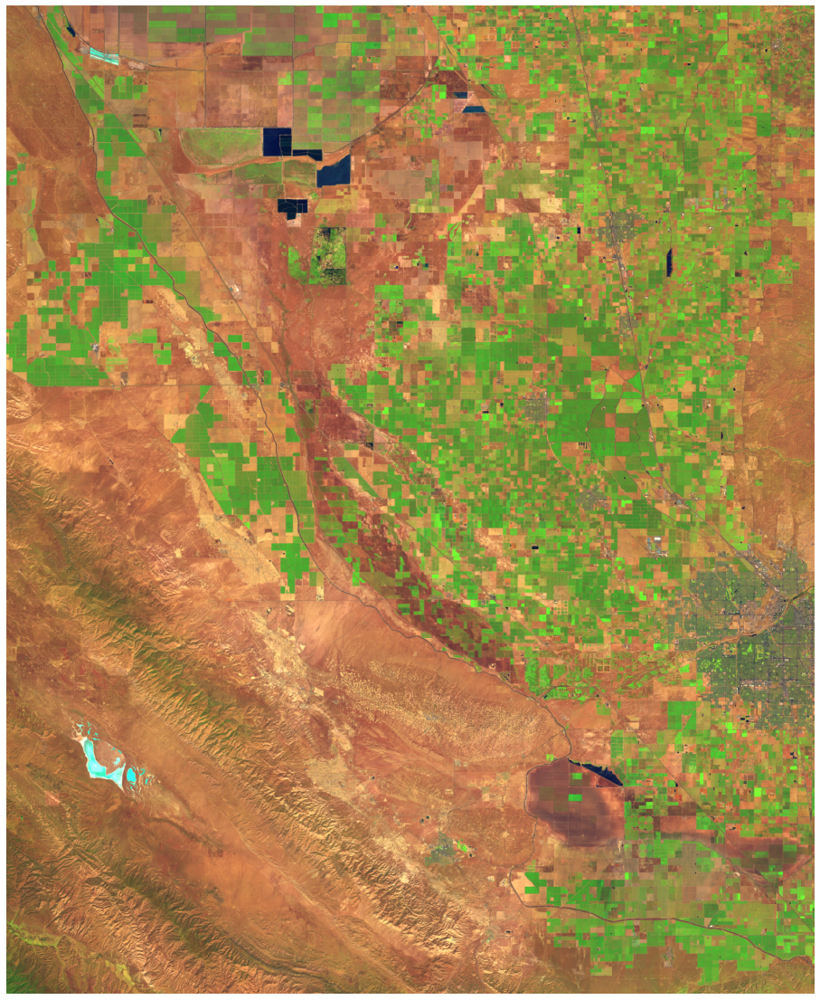

In [96]:
grid_paths = [['S2_2018_35.875_-119.875',
              'S2_2018_35.875_-119.625',
              'S2_2018_35.875_-119.375',
              'S2_2018_35.875_-119.125'],
             ['S2_2018_35.625_-119.875',
              'S2_2018_35.625_-119.625',
              'S2_2018_35.625_-119.375',
              'S2_2018_35.625_-119.125'],
              ['S2_2018_35.375_-119.875',
              'S2_2018_35.375_-119.625',
              'S2_2018_35.375_-119.375',
              'S2_2018_35.375_-119.125'],
              ['S2_2018_35.125_-119.875',
              'S2_2018_35.125_-119.625',
              'S2_2018_35.125_-119.375',
              'S2_2018_35.125_-119.125'],    
             ]
plot_grid(grid_paths, ag_names, 6)

In [97]:
def plot_grid_index(base_paths, index, month, scale = SCALE_FACTOR):
    imarrays = []
    nrows, ncols = np.shape(base_paths)
    
    assert(index in 'VI MI'.split())
    if index =='VI':
        b1 = 'B8'
        b2 = 'B4'
        color_map = 'RdYlGn'
    else:
        b1, b2 = 'B8A', 'B11'
        color_map = 'hsv'
    
    for row in base_paths:
        for base_path in row:
            # First finds related GeoTIFF path and reads values as an array
            with rasterio.open(f'./{base_path}/{base_path}_msi_{b1}_{month}.tif') as band_ds:
                b1_data = band_ds.read(1)
                
            with rasterio.open(f'./{base_path}/{base_path}_msi_{b2}_{month}.tif') as band_ds:
                b2_data = band_ds.read(1)
            
            imarray = (b1_data-b2_data) / (b1_data + b2_data)
            imarrays.append(imarray)

    fix, axes = plt.subplots(ncols=ncols,
                             nrows=nrows,
                             sharex=True,
                             sharey=True,
                             figsize=(4*ncols,5.02*nrows))
    axes = axes.flatten()
    for i, img in enumerate(imarrays):
        axes[i].imshow(img, cmap=color_map)
    for ax in axes:
        ax.set_axis_off()
        
    plt.subplots_adjust(hspace=0.0,wspace=0.0)

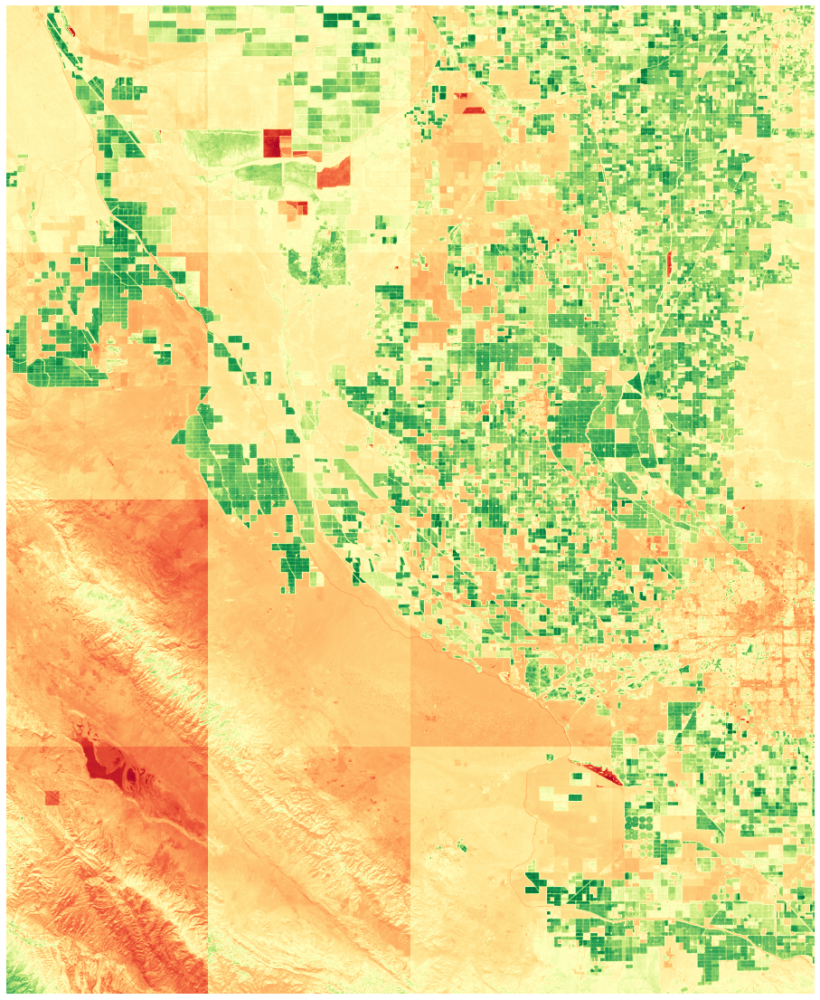

In [98]:
plot_grid_index(grid_paths, 'VI', 6)

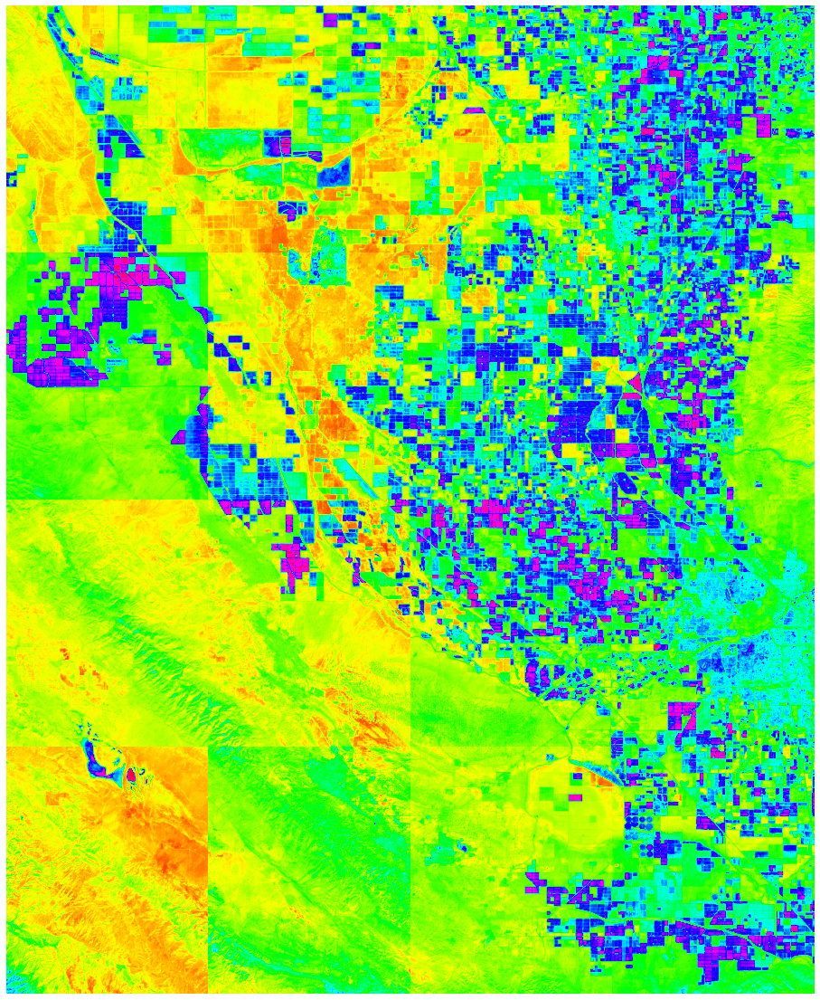

In [99]:
plot_grid_index(grid_paths, 'MI', 6)